# Smartdarts: Automated Dart Scoring With Computer Vision on Portable Camera

This Notebook helps to understant how the implementation for Smartdarts is done. Just Follow the steps and have fun!

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Import Libariries

In [ ]:
import cv2
import numpy as np

## 2. Display Function

In [ ]:
from google.colab.patches import cv2_imshow

def display(var_name, frame_size=None):
    if frame_size is None:
        cv2_imshow(var_name)
    else:
        resized_image = cv2.resize(var_name, frame_size)
        cv2_imshow(resized_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

## 3. Cropping Function

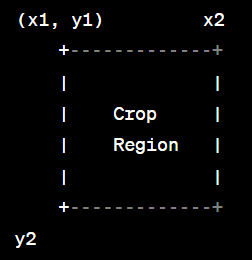

In [ ]:
def crop_image(image, x1, y1, x2, y2):
    """
    Crop a region from the input image based on specified coordinates.

    Args:
        image (numpy.ndarray): The input image.
        x1 (int): x-coordinate of the left edge.
        y1 (int): y-coordinate of the upper edge.
        x2 (int): x-coordinate of the right edge.
        y2 (int): y-coordinate of the lower edge.

    Returns:
        numpy.ndarray: The cropped image.
    """
    if image is None:
      print("Error: Image not loaded")
    else:
      # Perform resizing operation here
      cropped_image = image[y1:y2, x1:x2]
    return cropped_image

45 degree: x1, y1, x2, y2 = 1942, 212, 2654, 1681 <br>
60 degree: x1, y1, x2, y2 = 430, 334, 1580, 1745 <br>
90 degree: x1, y1, x2, y2 = 1064, 202, 2478, 1601 <br>
x1, y1, x2, y2 = 1927, 227, 1845, 1245





dart_final_Dataset<br>
45 degree: x1, y1, x2, y2 = 1942, 212, 2654, 1681<br>
60 degree: x1, y1, x2, y2 = 1181, 870, 2367, 1977<br>
90 degree: x1, y1, x2, y2 = 1064, 202, 2478, 1601<br>

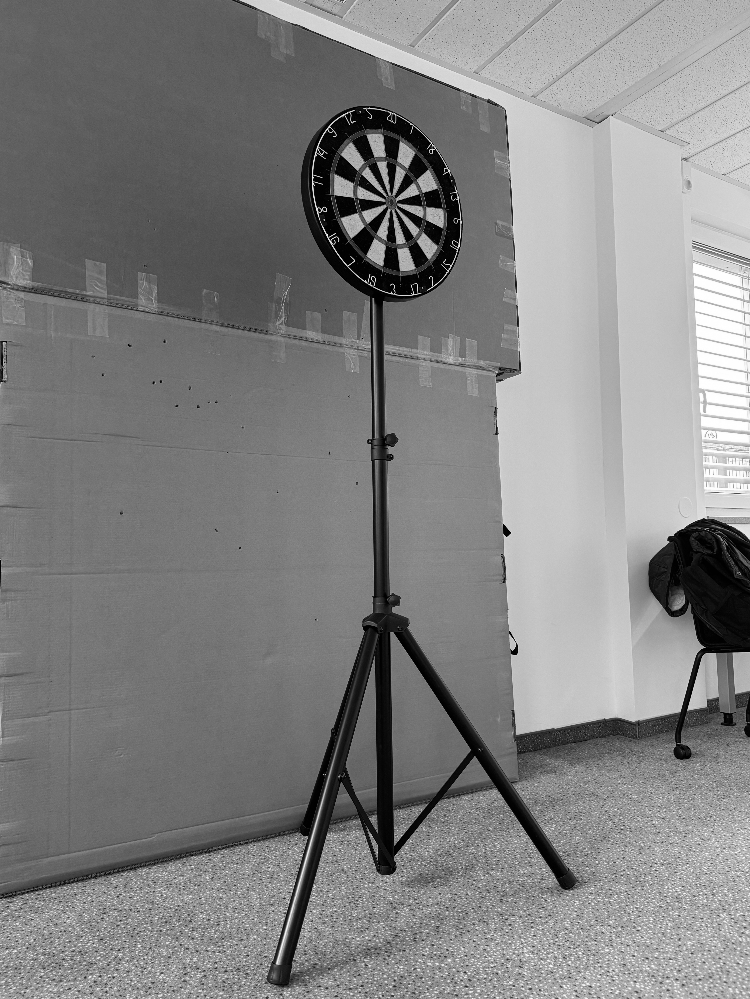

In [ ]:
background_image = cv2.imread("/content/background.JPG")
background_image = cv2.cvtColor(background_image, cv2.COLOR_BGR2GRAY)
display(background_image)

Make sure x1, y1, x2, y2 must be cover the whole dartboard as seen below.

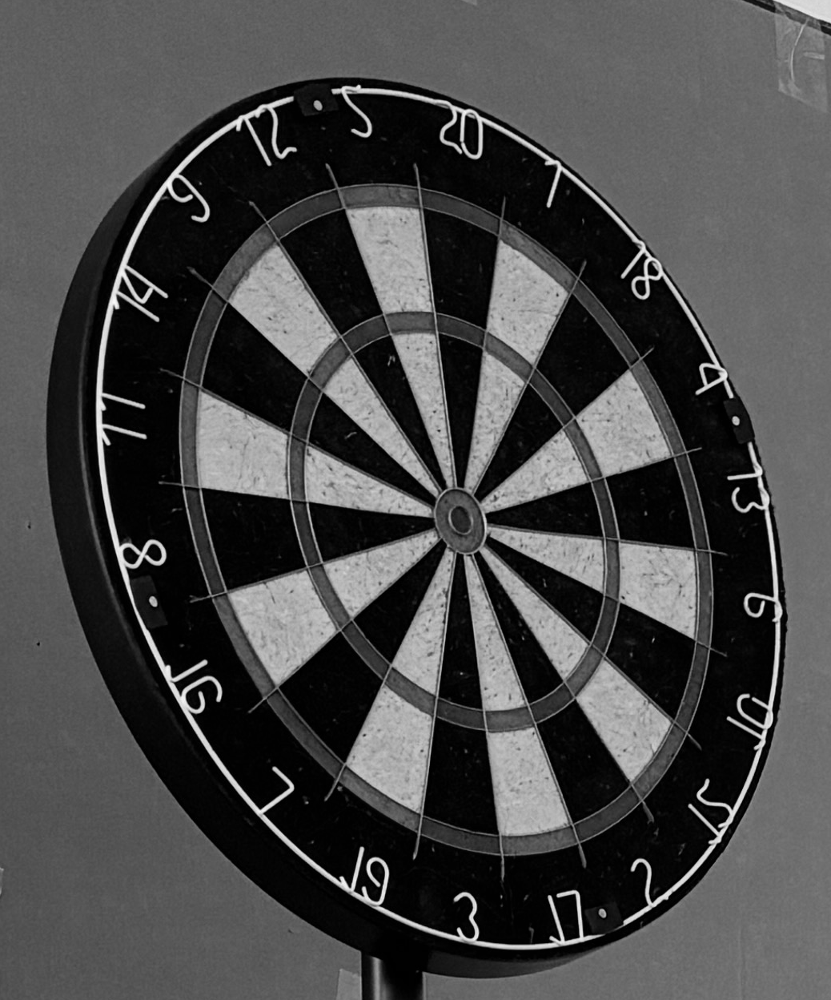

In [ ]:
x1, y1, x2, y2 = 1661, 508, 2699, 1756
background_image = crop_image(background_image, x1, y1, x2, y2)
display(background_image)

## 4. Extracting ROI

Threshold for 60 degree is 25

The dartboard scoring area is the particular region of interest (ROI) that could be extracted from an input image using the extracting_roi function. It utilizes the use of Python image processing methods with the OpenCV package to identify and extract the target object from the image at hand. To locate and isolate the dartboard, a series of steps are involved, including grayscale conversion, Gaussian blurring, thresholding, contour detection, and contour area calculation.<br>


**Function Processing Steps**<br>

1. **Grayscale Conversion:<br>**
The picture is transformed into a grayscale version. This improves the next processing stages by reducing the image to a single channel and emphasizing intensity over color.

2. **Gaussian Blurring:<br>**
The grayscale picture is blurred using Gaussian blur. Gaussian blur is a filtering method that modifies each pixel in the image using a Gaussian function. It improves contour detection by lowering noise and sharpness in the image and smoothing it down. The Gaussian function can be represented as:
$$ G(x, y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2 + y^2}{2\sigma^2}} $$

 where
σ is the standard deviation, and x and
y are distances from the central pixel in the kernel. The values in the Gaussian kernel decrease with distance from the central pixel, giving more weight to pixels closer to the center.

3. **Thresholding:<br>**
To the blurry image, a binary threshold is applied. In this step, the image is converted to a binary format (black and white), with pixels brighter than the threshold value (255) being set to white and those darker than the threshold value to black (0). This process is crucial for identifying distinct contours.

4. **Contour Detection:<br>**
The function uses the binary picture to identify the contours. The lines or curves that connect all of the continuous spots with the same hue or intensity along an object's boundaries are commonly referred to as contours.

5. **Contour Area Calculation and Selection:<br>**
The observed contours regions are computed. Based on their size, this data is utilized to determine which dartboard curves are most essential. A larger enclosing object or the background or whole dartboard could be the largest contour, hence the dartboard scoring region is presumed to be the second largest contour.

6. **Mask Creation and Contour Drawing:<br>**
A mask is created, and the relevant contour (dartboard scoring region) is drawn on this mask. The dartboard is separated from the background of the photograph by this mask.

7. **Isolation of the Dartboard:<br>**
A bitwise AND operation is used to merge the mask with the original image. The AND operation in binary logic accepts two bits as input and outputs one bit. If both input bits are 1, then the output is 1; if not, it is 0. In this step, all other areas of the image are hidden and the dartboard is isolated.


In [ ]:
def extracting_roi(image, threshold=25, blur_kernel_size=9):

    """
    Arguments:
    image: The input image in which the dartboard is to be isolated.
    threshold: The threshold value for binary thresholding (default = 25).
    blur_kernel_size: The size of the kernel for Gaussian blur (default = 9).

    Output:
    isolated_dartboard: The image with only the dartboard isolated.
    """
    # Convert image to grayscale
    #grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Guassian Filtering
    blur_grayscale_gb = cv2.GaussianBlur(image, (9,9),0)

    # Apply thresholding to create a binary mask of the dartboard
    _, mask = cv2.threshold(blur_grayscale_gb, threshold, 255, cv2.THRESH_BINARY)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the largest contour (the dartboard)
    # dartboard_contour = max(contours, key=cv2.contourArea)

    # Calculate contour areas
    contour_areas = [cv2.contourArea(contour) for contour in contours]


    # # For 60 degree
    # dartboard_contour = []

    # for contour in contours:
    #     # Add your criteria to select specific contours
    #     area = cv2.contourArea(contour)
    #     if area > 209 and area < 810832.5:
    #         dartboard_contour.append(contour)


    # Assuming contours_60 is already defined and contains your contours
    dartboard_contour = []
    areas_with_contours = []

    # Calculate area for each contour and store it along with the contour
    for contour in contours:
        area = cv2.contourArea(contour)
        areas_with_contours.append((area, contour))

    # Sort the list by area in descending order
    areas_with_contours.sort(key=lambda x: x[0], reverse=True)

    # Check if there are at least two contours
    if len(areas_with_contours) >= 2:
        # Get the contour with the second largest area
        second_largest_contour = areas_with_contours[1][1]

        # Append this contour to dartboard_contour_60
        dartboard_contour.append(second_largest_contour)

    # Create an empty mask for the dartboard
    dartboard_mask = np.zeros_like(mask)

    # Create a black mask with the same size as the image for 60 degree
    dartboard_mask = np.zeros(image.shape[:2], dtype="uint8")

    # Draw the contour on the mask
    # cv2.drawContours(dartboard_mask, [dartboard_contour], -1, 255, thickness=cv2.FILLED)
    # for 60 dregree
    cv2.drawContours(dartboard_mask, dartboard_contour, -1, 255, thickness=cv2.FILLED)

    # Bitwise AND the mask with the original image to isolate the dartboard
    isolated_dartboard = cv2.bitwise_and(image, image, mask=dartboard_mask)

    return isolated_dartboard, second_largest_contour



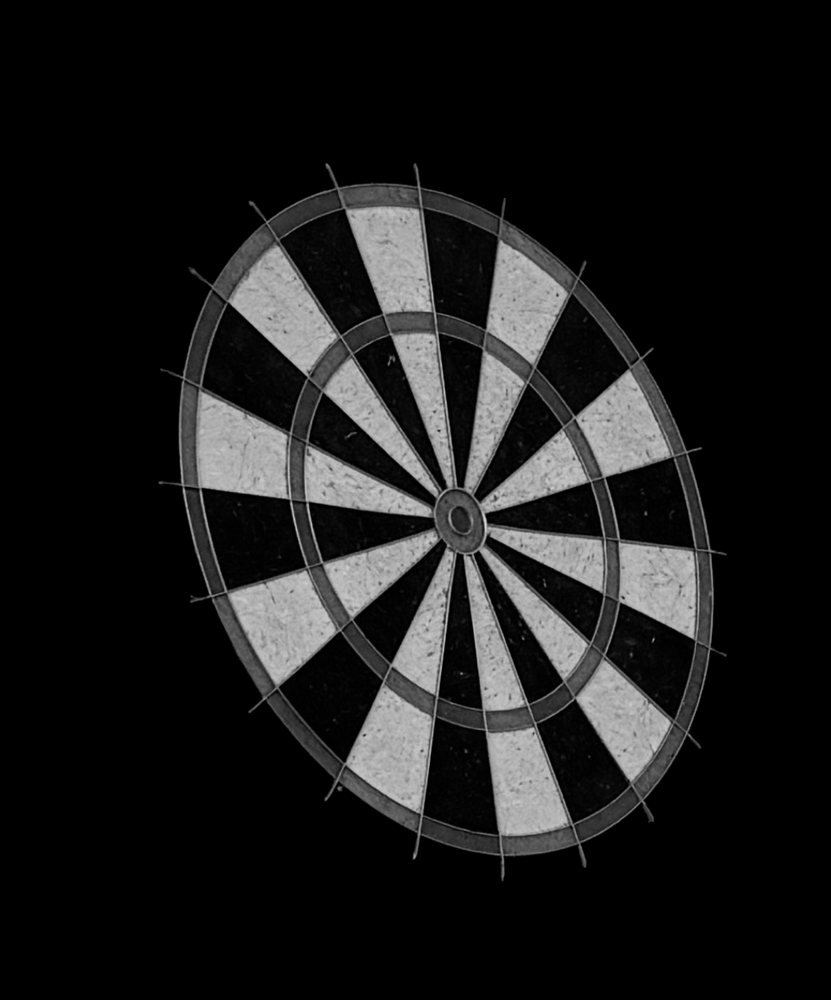

In [ ]:
isolated_dartboard, second_largest_contour = extracting_roi(background_image)
display(isolated_dartboard )


## 5. Transforming the dartboard and getting the center coordinates

The transformation function is intended for feature extraction from an isolated dartboard image and perspective transformation. This procedure entails converting the dartboard into a common rectangular perspective, obtaining contours, and computing the bounding box's radius and center. It is helpful in situations when examining dartboards from various viewpoints and distances is necessary.

1. **Define Standardized Rectangle Corners:**<br>
A standard rectangle that will be the target shape for the perspective transformation is defined at the beginning of the function.

2. **Adjust Corners with Padding Factor:**<br>
The destination corners are gently shifted inward depending on a padding factor to provide flexibility. This produces a layer of padding around the modified dartboard.

3. **Calculate Perspective Transformation Matrix:**<br>
The function computes the transformation matrix (M) that translates the dartboard corners (dartboard_corners) to the adjusted corners of the destination rectangle (adjusted_dst_corners) using OpenCV's cv2.getPerspectiveTransform. It is feasible to modify images to view the subject from a different perspective, usually a bird's-eye view, by using this matrix, which is crucial for executing perspective transformations.<br>
A transformation matrix, which is a 3x3 matrix in the case of perspective transformations. The general form of a perspective transformation matrix is:

\begin{bmatrix}
a & b & c \\
d & e & f \\
g & h & i
\end{bmatrix}

For a point  (x, y) in the original image, its transformed coordinates (x', y')  are calculated as:

$$
x' = \frac{ax + by + c}{gx + hy + i}
$$

$$
y' = \frac{dx + ey + f}{gx + hy + i}
$$

This function requires two sets of four points each: the source points and the destination points. These points are usually the corners of the region of interest in the image.

- **Source Points:** Four points in the input image that define the perspective of the current view.<br>
- **Destination Points:** Four points defining the desired rectangle (often a straightened, front view) that the source points should map to after the transformation.

4. **Apply Perspective Transformation:**<br>
The isolated dartboard picture(dartboard scoring region) is warped from a perspective using cv2.warpPerspective and the transformation matrix. The outcome is a modified, rectangular dartboard image that has been standardized.

***Steps to apply Perspective Transformation:***<br>
- **For Each Pixel in the Output Image:**
The inverse of the transformation matrix is multiplied by the coordinates of this pixel to determine the equivalent coordinates in the original image.

- **Coordinate Mapping:**<br>
Direct pixel-to-pixel mapping is impossible since the mapped coordinates in the source image are often floating-point numbers rather than integer values. Interpolation becomes useful here.

- **Interpolation:**<br>
By using interpolation, the function determines the value of the pixel at these floating-point coordinates by estimating the values of neighboring pixels. For instance, bilinear interpolation computes a weighted average of these four pixels by taking into account the nearest 2x2 neighborhood of known pixel values surrounding the point.

- **Assigning the Pixel Value:**<br>
The calculated pixel value is then assigned to the corresponding pixel in the output image.

5. **Grayscale Conversion and Gaussian Blurring:**<br>
The transformed dartboard image is then converted to grayscale and blurred using Gaussian blur. This step is preparatory for contour detection.

6. **Contour Detection:**<br>
The function detects contours in the blurred grayscale image using cv2.findContours. This step is crucial for identifying the outer boundary of the dartboard.

7. **Bounding Box Calculation:**<br>
The bounding box of the detected contour is calculated using cv2.boundingRect, which provides the dimensions and position of the smallest rectangle enclosing the dartboard.
8. **Center and Radius Calculation:**<br>
The center coordinates and the radius of the dartboard are determined based on the dimensions of the bounding box.

In [ ]:
def transformation(isolated_dartboard, dartboard_corners, dst_width=400, dst_height=400, padding_factor=0.2):
    """
    Arguments:
    isolated_dartboard: The pre-processed image of the dartboard isolated from its background.
    dartboard_corners: The coordinates of the corners of the dartboard in the original image.
    dst_width (optional): The width of the destination rectangle for perspective transformation (default = 400).
    dst_height (optional): The height of the destination rectangle for perspective transformation (default = 400).
    padding_factor (optional): Factor used to adjust the corners of the destination rectangle inward (default = 0.2).

    Outputs:
    transformed_dartboard: The dartboard image after perspective transformation.
    transformed_corners: The transformed coordinates of the dartboard corners.
    center_coordinates: The calculated center coordinates of the dartboard.
    radius: The calculated radius of the dartboard.
    contours: The detected contours in the transformed dartboard image.
    """

    # Define the corners of the standardized rectangle
    dst_corners = np.array([
        [0, 0],
        [dst_width - 1, 0],
        [dst_width - 1, dst_height - 1],
        [0, dst_height - 1]
    ], dtype=np.float32)

    dartboard_corners = np.array(dartboard_corners, dtype=np.float32)
    dst_corners = np.array(dst_corners, dtype=np.float32)

    # Calculate the adjustment value
    padding_value = int(dst_width * padding_factor)

    # Adjust the destination corners slightly inward
    adjusted_dst_corners = np.array([
        [padding_value, padding_value],
        [dst_width - 1 - padding_value, padding_value],
        [dst_width - 1 - padding_value, dst_height - 1 - padding_value],
        [padding_value, dst_height - 1 - padding_value]
    ], dtype=np.float32)

    # Calculate the perspective transformation matrix using 'dartboard_corners' and 'adjusted_dst_corners'
    M = cv2.getPerspectiveTransform(dartboard_corners, adjusted_dst_corners)

    # Use perspective transformation to get the transformed coordinates of the corners
    transformed_corners = cv2.perspectiveTransform(dartboard_corners.reshape(-1, 1, 2), M)

    # Reshape the transformed corners to a flat array
    transformed_corners = transformed_corners.reshape(-1, 2)

    # Apply the perspective transformation to the original image
    transformed_dartboard = cv2.warpPerspective(isolated_dartboard, M, (dst_width, dst_height))

    # Convert the image to grayscale
    #gray_transformed_dartboard = cv2.cvtColor(transformed_dartboard, cv2.COLOR_BGR2GRAY)

    blurred_gray_transformed_dartboard = cv2.GaussianBlur(transformed_dartboard , (3, 3), 0)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(blurred_gray_transformed_dartboard, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Assuming only one contour i.e the outer part of the ellipse
    contour = contours[0]

    # Find the bounding box of the contour
    x, y, w, h = cv2.boundingRect(contour)

    # Calculate center coordinates
    center_coordinates = (int(x + w / 2), int(y + h / 2))

    # Calculate radius
    radius = int((w + h) / 4)

    return transformed_dartboard, transformed_corners, center_coordinates, radius, contours, M

Below dartboard_corners are assigned Manually. Just download the isolated_dartboard image which can be seen in 2 cells above. Then Open the image with paints or other software and place your cursor on th points as shown below. Red is the first point,blue is second, yellow is third and green the last one.

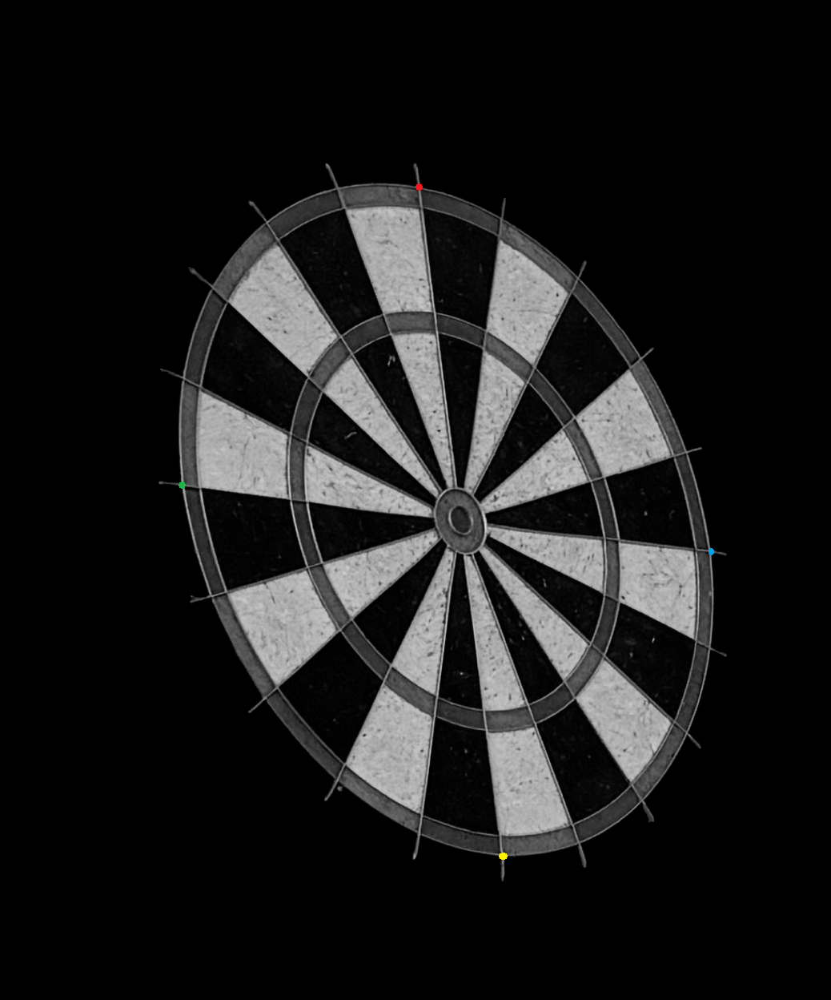

In [ ]:
dartboard_corners = [np.array([523, 232], dtype=np.int32),
                     np.array([887, 689], dtype=np.int32),
                     np.array([628, 1067], dtype=np.int32),
                     np.array([228, 606], dtype=np.int32)]


# isolated_dartboard = extracting_roi(background_image)
result = transformation(isolated_dartboard, dartboard_corners)

# Unpack the result
transformed_dartboard, transformed_corners, center_coordinates, radius, contours, M = result

In [ ]:
radius

181

In [ ]:
center_coordinates

(198, 201)

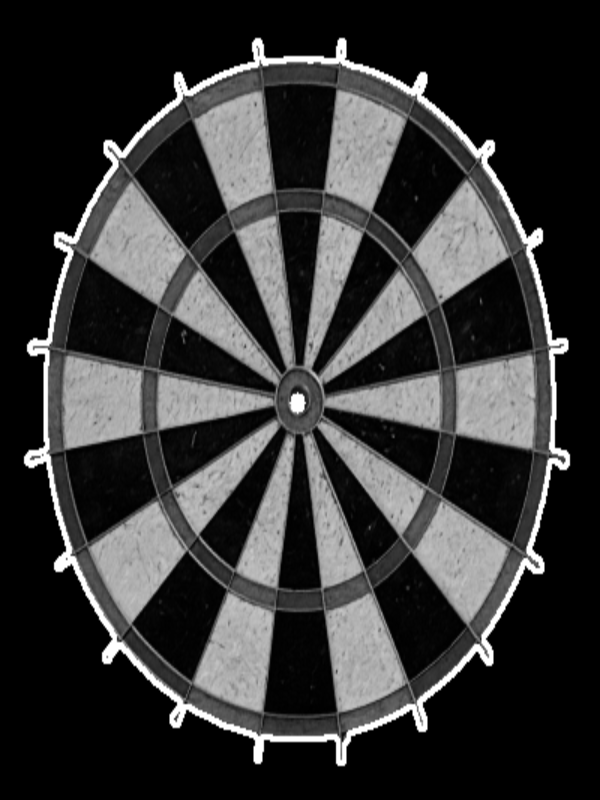

In [ ]:
# Draw the contours on a copy of the original image (so you don't modify the original)
contour_image = transformed_dartboard.copy()
cv2.drawContours(contour_image, contours, -1, (255, 0, 0), 2)  # -1 means draw all contours, (0, 255, 0) is the color, and 2 is the thickness
# Draw the center coordinate
cv2.circle(contour_image, center_coordinates, 5, (255, 0, 0), -1)  # Blue circle for the center
display(contour_image, frame_size=(600, 800))

## 6. Extracting the dart coordinates

The preprocessing involves cropping of raw image of dartboard along with darts and then apply some methods to remove noise. First the cropped image has been converted to gray scale as it reduces the image to single channel and emphasize the intensity over color.
The Wavelet denoising function is used for denoising the gray scale image using wavelet transform as part of preprocessing.<br>


**Function Processing Steps**<br>

1. **Image Decomposition:<br>**
The image is decomposed into wavelet coefficients using 2D wavelet transform. The specified wavelet is Daubechies wavelet of order 1. The level is 1 so the transformation is applied only once.

2. **Thresholding:<br>**
Soft thresholding is applied in order to remove noise from each coefficients if it is instance of NumPy ndarray otherwise the coefficients remains unchanged. The threshold value is 0.1.

3. **Reconstruction:<br>**
The modified coefficients after soft thresholding are reconstructed in order to reform the denoised image.

After applying all given techniques the result image becomes smooth gray scale image with minimal noise.

In [ ]:
import pywt

def apply_wavelet_denoising(image, wavelet='db1', level=1):
    # Decompose the image using wavelet transform
    coeffs = pywt.wavedec2(image, wavelet, level=level)

    # Threshold the wavelet coefficients (remove noise)
    coeffs = [pywt.threshold(c, 0.1, mode='soft') if isinstance(c, np.ndarray) else c for c in coeffs]

    # Reconstruct the denoised image
    denoised_image = pywt.waverec2(coeffs, wavelet)

    return denoised_image.astype(np.uint8)


# def gray_world_assumption(image):
#     # Calculate the average color value for each channel
#     avg_channel_values = np.mean(image, axis=(0, 1))

#     # Calculate the scaling factors for each channel
#     scaling_factors = np.mean(avg_channel_values) / avg_channel_values

#     # Apply scaling to each channel
#     corrected_image = np.multiply(image, scaling_factors).astype(np.uint8)

#     return corrected_image


In [ ]:
def preprocess(image, x1, y1, x2, y2):
    image = crop_image(image, x1, y1, x2, y2)
    #display(image)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    #image_smoothed = cv2.GaussianBlur(gray_image, (2, 2), 7, cv2.BORDER_DEFAULT)
    #image_smoothed = cv2.GaussianBlur(gray_image, (5,5), 0)
    #image_blur = cv2.medianBlur(gray_image,5)
    #gray_world_i = gray_world_assumption(gray_image)
    image_smoothed = apply_wavelet_denoising(gray_image)

    return image_smoothed

### 7.1 Image Differnces

The series of functions below is used to preprocess the images and then extract the structural difference between two images of dartboards. These darts are further processed to locate its tip location and calculate the score. <br>


**Function Processing Steps**<br>

1. **Create SIFT object:<br>**
Initialization of Scale-Invariant Feature Transform(SIFT) object. SIFT algorithm is used to identify keypoints (interest points) in the image and for computation of descriptors for these keypoints.

2. **Find keypoints and descriptors:<br>**
A method to extract keypoints and descriptors from an image has been applied. The keypoints are the interesting regions in the image that are distinctive and invariant to scale, rotation, and illumination changes. The descriptors represent the local image features around each keypoint and are used feature matching.  Keypoints and descriptors provide a robust way to match corresponding features between two images.

3. **Color space conversion:<br>**
The provided background and foreground images are gray scale. They are converted to 3 channel (RGB) to replicate the single channel intensity values into all three color channels. This makes easy to draw and visualize the keypoints in image.

4. **Brute-Force matcher:<br>**
Initialization of Brute Force matcher object. BF matcher is simple algorithm used for matching the descriptors obtained from different images.
5.	**Match descriptor:<br>**
It takes two sets of descriptors of background and foreground image and finds k-nearest matches. Each element in matches contains list of two matches for each descriptor. The matches are ordered by the distances.
6.	**Filter matches:<br>**
The matches are filtered by the distance. If the distance to the best match is significantly smaller than distance to second best match then it has been considered as good match.
7.	**Draw the matches:<br>**
For visualization purpose the filtered best matches of descriptors have been drawn in an separate image.
8.	**Get coordinates of corresponding points:<br>**
The arrays containing the (x,y) coordinates of keypoints in foreground image and background image are retrieved. The list of coordinates is then reshaped to dimensions (-1, 1, 2) as this format is suitable for finding the Homography matrix.
9.	**Homography matrix computation:<br>**
Random Sample Consensus (RANSAC) algorithm has been used to obtain the Homography matrix between the obtained points. It is for the outlier rejection during matrix estimation. RANSAC iteratively selects subset of correspondences, estimates the homography matrix and identifies the outliers. The maximum allowable reprojection error is 0.5 pixels. The correspondences greather than 0.5 are considered as outliers and are eliminated from estimation.
10.	**Perspective transformation:<br>**
As the darts to be located are in foreground image, a perspective transformation has been applied to foreground image using the calculated Homography matrix. The transformation ensures that keypoints are aligned with their corresponding keypoints in the background image. Expression for perspective transformation in as given below.  

$$
\begin{bmatrix}
t \cdot x' \\
t \cdot y' \\
t
\end{bmatrix}
=
\begin{bmatrix}
a1 & a2 & b1 \\
a3 & a4 & b2 \\
c1 & c2 & 1
\end{bmatrix}
\cdot
\begin{bmatrix}
x \\
y \\
1
\end{bmatrix}
$$

Here (x',y') are transformed points and (x,y) are the input points. The transformation matrix can be seen as combination of

$$
\begin{bmatrix}
a1 & a2 \\
a3 & a4
\end{bmatrix}
$$
defines transformation such as rotation, scaling etc.

$$
\begin{bmatrix}
b1 \\
b2
\end{bmatrix}
$$
defines translation vector

$$
\begin{bmatrix}
c1 & c2
\end{bmatrix}
$$
projection vector

11.	**Gaussian smoothing:<br>**
This technique is applied to both images with (7,7) kernel, which is extent of smoothing and standard deviation of 0. Means that it is calculated based on kernel size. It reduces noise and details in the image while preserving important structure. So it is used as preprocessing step before image comparison technique.

12.	**Extract the difference:<br>**
The function structural similarity index (SSI) from the scikit image library has been used to compare two images. It returns full structural similarity image, not just SSIM score. The result of this function contains SSIM score and the full structural similarity image. This structural similarity is then scaled to the range [0,255] to make it suitable for visualization. The higher values in difference map indicates to the regions with more dissimilarity between images.

In [ ]:
from skimage.metrics import structural_similarity as compare_ssim

def Difference(background_image, foreground_image):
    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Find keypoints and descriptors with SIFT
    keypoints_Ix_y, descriptors_Ix_y = sift.detectAndCompute(forground_image, None)
    keypoints_Bx_y, descriptors_Bx_y = sift.detectAndCompute(background_image, None)

    # Create copies of the images for visualization
    Ix_y_vis = cv2.cvtColor(forground_image, cv2.COLOR_GRAY2BGR)
    Bx_y_vis = cv2.cvtColor(background_image, cv2.COLOR_GRAY2BGR)

    # Draw keypoints on the images
    cv2.drawKeypoints(Ix_y_vis, keypoints_Ix_y, Ix_y_vis, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    cv2.drawKeypoints(Bx_y_vis, keypoints_Bx_y, Bx_y_vis, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptors_Ix_y, descriptors_Bx_y, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    # Draw matches
    img_matches = cv2.drawMatches(forground_image , keypoints_Ix_y, background_image , keypoints_Bx_y, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Get corresponding points
    src_pts = np.float32([keypoints_Ix_y[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints_Bx_y[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Find Homography matrix
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Apply Homographic transpose
    #aligned_image = cv2.warpPerspective(forground_image, M, (background_image.shape[1], background_image.shape[0]))
    aligned_image = cv2.warpPerspective(forground_image, M, (forground_image.shape[1], forground_image.shape[0]),  borderMode=cv2.BORDER_REPLICATE)

    #aligned_image = aligned_image[:background_image.shape[0], :background_image.shape[1]]
    # Apply Gaussian smoothing
    Ix_y_smooth = cv2.GaussianBlur(aligned_image, (7, 7), 0)
    Bx_y_smooth = cv2.GaussianBlur(background_image, (7, 7), 0)

    (score, diff) = compare_ssim(Bx_y_smooth, Ix_y_smooth, full=True)
    diff = (diff * 255).astype("uint8")

    #display(diff, frame_size=(500, 900))

    return diff

### 7.2 Noise Removal

This function is aimed to reduce the noise in the difference image. It involves multiple noise removal and filter techniques to remove unwanted regions and to extract only darts as part of difference so that localizing the dart tip becomes more accurate. <br>


**Function Processing Steps**<br>

1. **Thresholding:<br>**
The binary mask of the structural difference map has been obtained to analyse areas of significant difference. Binary inversion sets the pixel values below threshold to 255 (white) and above threshold to 0 (black). Otsu’s method is useful for automatically determine the threshold value based on image’s histogram. The result image contains binary mask where pixels corresponding to areas of dissimilarity set to 255 (white) and pixels corresponding to similarity set to 0 (black).

2. **Morphological operation – Closing:<br>**
Morphological operations are useful for enhancing the binary regions in the image. Closing operation fills the small holes and gaps in the binary area and smoothens the boundaries. It is dilation of image followed by erosion. Structuring element for this operation is 4 X 4 square shaped.

3. **Morphological operation – Opening:<br>**
Opening is useful for clean up binary image, remove small artifacts, and separate connected regions. It is erosion followed by dilation. The structuring element for this operation is same as closing.

4. **Fill countours:<br>**
After removing noise and enhancing the binary masks, some large gaps remain still there to fill up. So in order to separately fill each contours with white colour ([255,255,255]) the fill poly function has been used. The mode to retrieve contours is RETR_EXTERNAL, which means it get only external contours to fill.

3. **Dilation:<br>**
Dilation expands the white regions in binary image by adding pixels to the boundaries. Basically it increases the size of binary region. In this case it has been used to connect the binary areas very close to each other – to get fully connected shape of dart. Structuring element for this operation is 5 X 5 square shaped. Here, dilation has been applied four times consecutively.

3. **Erosion:<br>**
After applying dilation, in most cases the shape of binary mask does not remain as original and also it overlaps two separate regions which do not require to be connected. So in this case erosion has been applied in order to reduce the unwanted thickness of binary region and detach the regions which should not be connected. Here, erosion has been done twice with same structuring element as dilation.

3. **Filter out small regions:<br>**
Due to lightning condition sometimes other parts of dartboard along with darts also extracted out as difference. The area of these parts is bigger that they cannot be filtered out by above all operations. So an area threshold has been applied here to filter out them – convert them to black region. The threshold value is around average area of dart mask. So, areas which are only bigger than this threshold are converted to white which are considered as dart masks.
The connected component function performs labelling on binary image and returns various information about the labelled components such as number of labels, labelled image, statistics of each components and centroid. The components returned by this function are further used to calculate the area and filter them out.

In [ ]:
def Remove_noise(diff):
    thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    # Threshold only the areas with high intensity differences (dart on the board)
    #thresh = cv2.threshold(diff, threshold_value, 255, cv2.THRESH_BINARY_INV)[1]

    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, np.ones((4, 4), np.uint8))
    #display(closing, frame_size=(600, 800))

    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, np.ones((4, 4), np.uint8))
    #display(opening, frame_size=(600, 800))

    # Find outer contour and fill with white
    cnts = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    cv2.fillPoly(opening, cnts, [255,255,255])

    #display(opening, frame_size=(600, 800))

    kernel = np.ones((5, 5), np.uint8)
    dilate = cv2.dilate(opening, kernel ,iterations = 4)

    erode = cv2.erode(dilate, kernel ,iterations = 2)
    #display(dilate, frame_size=(600, 800))

    # do connected components processing
    nlabels, labels, stats, centroids = cv2.connectedComponentsWithStats(erode, None, None, None, 8, cv2.CV_32S)

    #get CC_STAT_AREA component as stats[label, COLUMN]
    areas = stats[1:,cv2.CC_STAT_AREA]

    result = np.zeros((labels.shape), np.uint8)

    for i in range(0, nlabels - 1):
        if areas[i] >= 5000:   #keep 1500
            result[labels == i + 1] = 255

    return result

### 7.3 Tip Detection

This function is used to localize and return the pixel location of dart tip landed on the surface of dart board. Here we are using concept of centre of mass (centroid) to locate the dart tip in threshold image. Because of shape of dart, the dart mask is always around the flight region of dart. So it has been assumed that the tip of dart is the farthest point from centre of mass within dart region. There can be still some noise due to background of dart board in the threshold image so to neglect that, the binary regions within dart board’s scoring contour are considered only to calculate centre of mass.

**Function Processing Steps**<br>

1. **Contour extraction:<br>**
In order to iterate through each binary mask present in image which are considered as the darts, all the contours present in threshold image have been extracted.

2. **Calculate moments:<br>**
To describe the distribution of pixel intensities in a region, moments are used as statistical measure. Here, we calculated various moments of each contour present in threshold image. The function returns dictionary of keys corresponding to different moments like ‘m00’, ‘m10’, ‘m01’ and so on. Below are the moments used in this case. <br>
**‘m00’**: Total area <br>
**‘m10’**: Centroid’s X coordinate (first-order spatial moment) <br>
**‘m01’**: Centroid’s Y coordinate (first-order spatial moment) <br>

3. **Calculate centroid:<br>**
The calculation of centroid from the moments is as given below.
$$
C_{x} = \frac{M_{10}}{M_{00}}
$$

$$
C_{y} = \frac{M_{01}}{M_{00}}
$$

4. **Identify farthest point (dart tip):<br>**
We calculated the Euclidian distance from centroid to each coordinate of contour in order to find the farthest point. Euclidian norm of vector of each distance is helpful for this calculation.

5. **Check point within scoring contour:<br>**
After getting the farthest point, we are checking that if it is present within dart board’s scoring region or not. This check is necessary because there can be other binary regions (noise) due to background of the dartboard. So, if the point is within contour that means it is dart only. Point polygon test function returns -1, 0 or 1 based on the distance of a given point from contour. If the point is inside or on the contour then it returns 1 or 0 otherwise -1. If function returns 0 or 1 then only farthest point has been considered as dart tip. And further the coordinates of this point are considered for score calculation.

In [ ]:
def Get_locations(image, original_image, mcont):
    img_copy = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

    dart_location = []

    # Thresholding to create a binary image
    _, thresh = cv2.threshold(image, 1, 255, cv2.THRESH_BINARY)

    # Find contours in the binary image
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        # calculate the centroid of the entire mask
        M = cv2.moments(cnt)

        # ensure that the mask has a valid area before further calculations
        if M["m00"] != 0:
            centroid_x = int(M["m10"] / M["m00"])
            centroid_y = int(M["m01"] / M["m00"])

            # draw a circle at the centroid
            cv2.circle(img_copy, (centroid_x, centroid_y), 5, (0, 255, 255), -1)

            # find the point farthest from the centroid within the contour
            farthest_point = max(cnt[:, 0, :], key=lambda point: np.linalg.norm(point - [centroid_x, centroid_y]))

            # draw a circle at the farthest point
            farthest_x, farthest_y = farthest_point

            #take point within dartboard scoring contour
            dist = cv2.pointPolygonTest(mcont, (int(farthest_x), int(farthest_y)), measureDist=True)

            if dist >= 0:
              cv2.circle(img_copy, (farthest_x, farthest_y), 5, (0, 0, 255), -1)
              cv2.circle(original_image, (farthest_x, farthest_y), 5, (0, 0, 255), -1)
              dart_location.append([farthest_x, farthest_y])

        # draw contour
        cv2.drawContours(img_copy, [cnt], 0, (0, 255, 255), 2)

    # draw the bounding rectangle of the largest contour (mcont)
    #x, y, w, h = cv2.boundingRect(mcont)
    #cv2.rectangle(img_copy, (x, y), (x+w, y+h), (255, 255, 102), 2)
    cv2.drawContours(img_copy, [mcont], 0, (0, 255, 255), 2)
    # display the result
    #display(img_copy, frame_size=(600, 800))
    return original_image, img_copy, dart_location

### 7.4 Getting Darts Coordinate

In [ ]:
import os
background_image = cv2.imread('/content/background.JPG')
x1, y1, x2, y2 = 1661, 508, 2699, 1756
background_image = preprocess(background_image, x1, y1, x2, y2)
_, score_contour = extracting_roi(background_image)

1_2.JPG [[612, 727]]


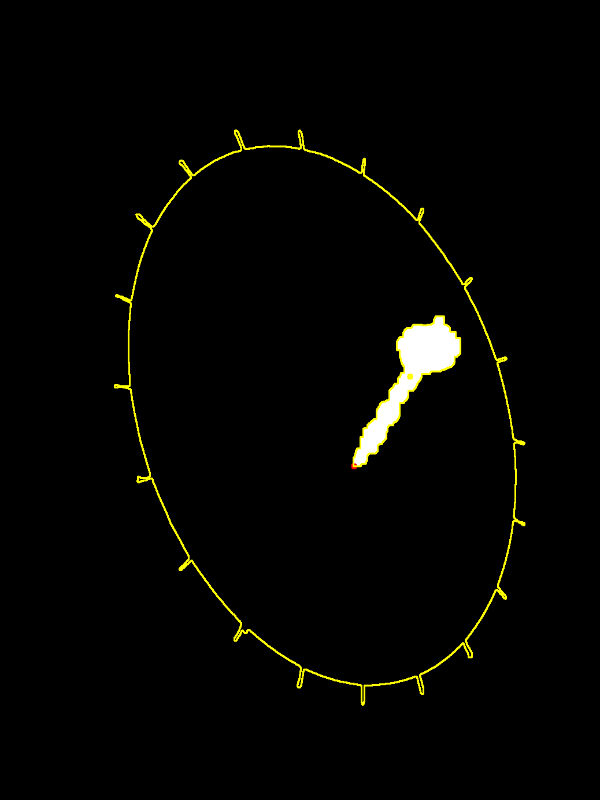

106_11.JPG [[388, 623]]


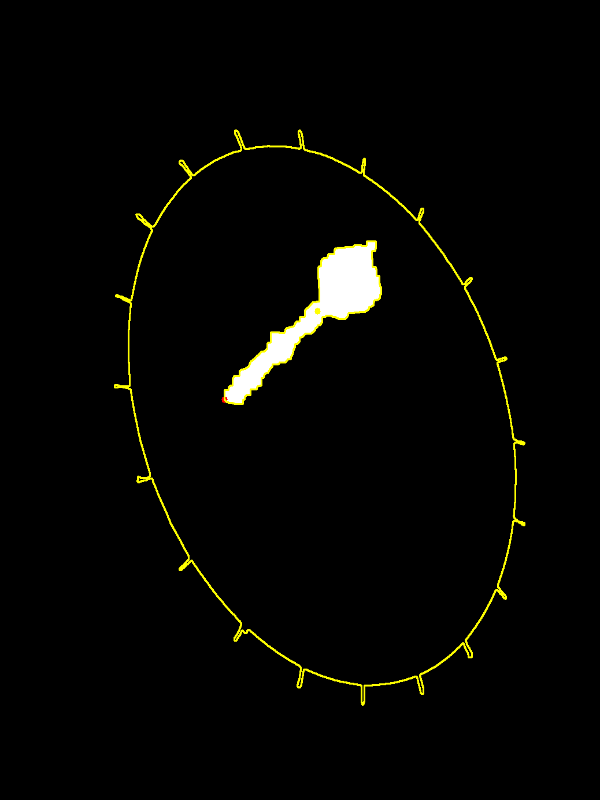

In [ ]:
folder_path = '/content/foreground_images'
image_files = [f for f in os.listdir(folder_path) if f.endswith('.JPG')]

# Initialize an empty list to store coordinates
coordinates_list = []

for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    img = cv2.imread(image_path)
    forground_image = preprocess(img, x1, y1, x2, y2)

    # Process the image as needed
    diff = Difference(background_image, forground_image)
    diff = Remove_noise(diff)
    result_img, diff_thresh, locations = Get_locations(diff, forground_image, score_contour)

    # Display the image (optional)
    # Append coordinates to the list
    coordinates_list.append(locations)
    print(image_file, locations)
    display(diff_thresh, frame_size=(600, 800))
    #display(result_img, frame_size=(600, 800))

In [ ]:
coordinates_list

[[[612, 727]], [[388, 623]]]

## 7. Dartboard Segmentation and Score Calculation

In the dartboard game, this function is used to determine the score of a dart throw. It locates the dart on the board using image processing algorithms, and then it computes the score using traditional dartboard scoring guidelines. This feature is a component of a bigger system that automatically scores dartboard images by processing their visuals.

Vector Rotation (rotate_vector):
Give 18 degrees of area to each segment (in radians)

Vector Angle Calculation (calculate_vector_angle):
Transforms the angle to degrees (from radians)

Score Finding (find_score):
Determines the score based on the dart's position relative to the center and the segment angles. Checks the angle of the dart's vector against predefined segment angles. Returns the corresponding score based on the dart's position.

Score Calculation Process:

Initializes a copy of the transformed dartboard image.
Defines the center coordinates of the dartboard.
Calculates an initial direction vector from the center to the first corner.
Divides the dartboard into 20 segments (standard for a - dartboard).
Calculates angles for each line segment. Assigns scores to each segment based on standard dartboard scoring.
Determines the multiplier for the score based on the dart's radial distance from the center.
Calls find_score to get the base score and then applies the multiplier.

In [ ]:
import numpy as np
import cv2

def calculate_dart_score(dart_position, transformed_dartboard, transformed_corners, center_coordinates):
    """
    Arguments:
    dart_position: The coordinates of the dart on the dartboard.
    transformed_dartboard: An image of the dartboard after perspective transformation.
    transformed_corners: The coordinates of the corners of the dartboard in the transformed image.

    Output:
    Returns the calculated score of the dart throw.
    """
    # Helper functions
    def rotate_vector(vector, angle):
        angle_rad = np.radians(angle)
        rotation_matrix = np.array([[np.cos(angle_rad), -np.sin(angle_rad)],
                                    [np.sin(angle_rad),  np.cos(angle_rad)]])
        return np.dot(rotation_matrix, vector)

    def calculate_vector_angle(vector):
        return np.degrees(np.arctan2(vector[1], vector[0]))

    def find_score(dart_position, center_coordinates, line_angles, scores):
        radius = np.linalg.norm(np.array(dart_position) - np.array(center_coordinates))
        if radius > 169:
            return 0
        dart_vector = np.array([dart_position[0] - center_coordinates[0], dart_position[1] - center_coordinates[1]])
        dart_angle = calculate_vector_angle(dart_vector)
        dart_angle = dart_angle if dart_angle >= 0 else dart_angle + 360
        for i in range(len(line_angles)):
            start_angle = line_angles[i]
            end_angle = line_angles[(i + 1) % num_segments]
            if start_angle < end_angle:
                if start_angle <= dart_angle < end_angle:
                    return scores[i]
            else:
                if dart_angle >= start_angle or dart_angle < end_angle:
                    return scores[i]
        return 0

    # Initialize the transformed dartboard image
    contour_image = transformed_dartboard.copy()

    # corner coordinates
    # center_coordinates = center_coordinates
    first_corner = (int(transformed_corners[0][0]), int(transformed_corners[0][1]))

    # Calculate initial direction vector from the center to the first corner
    initial_direction = np.array([first_corner[0] - center_coordinates[0], first_corner[1] - center_coordinates[1]])

    # Number of segments (20 for a standard dartboard)
    num_segments = 20

    # List to store line endpoints
    line_endpoints = []

    # Rotate and draw lines, store endpoints
    for i in range(num_segments):
        rotated_direction = rotate_vector(initial_direction, 18 * i)
        end_point = (int(center_coordinates[0] + rotated_direction[0]), int(center_coordinates[1] + rotated_direction[1]))
        line_endpoints.append(end_point)
        cv2.line(contour_image, center_coordinates, end_point, (0, 255, 0), 2)

    # Calculate angles for each line segment
    line_angles = [calculate_vector_angle(np.array([end_point[0] - center_coordinates[0], end_point[1] - center_coordinates[1]])) for end_point in line_endpoints]
    line_angles = [angle if angle >= 0 else angle + 360 for angle in line_angles]

    # Assign Scores to Segments
    scores = [20, 1, 18, 4, 13, 6, 10, 15, 2, 17, 3, 19, 7, 16, 8, 11, 14, 9, 12, 5]

    # Calculate the score with radius
    radius = np.linalg.norm(np.array(dart_position) - np.array(center_coordinates))
    if 159 <= radius <= 169:
        multiplier = 3
    elif 95 <= radius <= 105:
        multiplier = 2
    elif 7 <= radius <= 16:
        return 25  # Score is 25 for this range
    elif radius < 7:
        return 50  # Score is 50 for this range
    else:
        multiplier = 1  # Default multiplier

    return find_score(dart_position, center_coordinates, line_angles, scores) * multiplier



In [ ]:
import numpy as np

def transform_single_point(original_point, perspective_matrix):
    """
    Transform a single point using a perspective transformation matrix.

    Arguments:
    original_point: The original coordinates of the point (x, y).
    perspective_matrix: The perspective transformation matrix.

    Returns:
    transformed_point: The transformed coordinates of the point.
    """
    # Convert the original point to homogeneous coordinates
    original_point_homogeneous = np.array([original_point[0], original_point[1], 1], dtype=np.float32)

    # Apply the perspective transformation
    transformed_point_homogeneous = np.dot(perspective_matrix, original_point_homogeneous)

    # Convert back to Cartesian coordinates
    transformed_point = (transformed_point_homogeneous[0] / transformed_point_homogeneous[2],
                         transformed_point_homogeneous[1] / transformed_point_homogeneous[2])

    return transformed_point




In [78]:
# Transform each point in the list using the perspective matrix
transformed_coordinates = []
for point in coordinates_list:
    transformed_coordinates.append(transform_single_point(point[0], perspective_matrix=M))

# Print the transformed coordinates
print("Transformed Coordinates:")
for idx, transformed_point in enumerate(transformed_coordinates, start=1):
    print(f"Point {idx}: {transformed_point}")

Transformed Coordinates:
Point 1: (230.6584956122407, 210.78853514096147)
Point 2: (132.59848897168766, 264.6236790509069)


In [80]:
# dart_position = (295, 235)
for dart_position in transformed_coordinates:
  dart_score = calculate_dart_score(dart_position, transformed_dartboard, transformed_corners, center_coordinates)
  print(f"Dart at position {dart_position} scores {dart_score}")

Dart at position (230.6584956122407, 210.78853514096147) scores 2
Dart at position (132.59848897168766, 264.6236790509069) scores 11


 ### 7.1 Draw Points just to ensure the positions

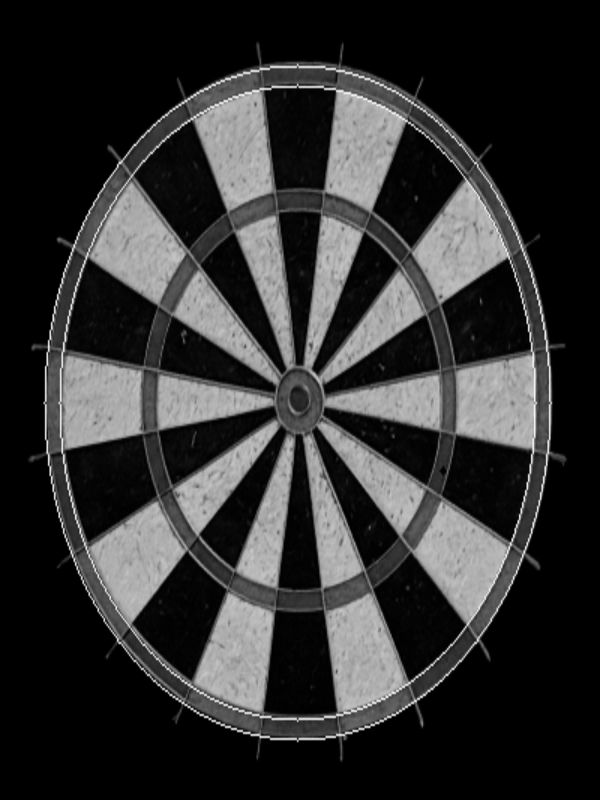

In [ ]:
def draw_dartboard(img, center, outer_radius, inner_radius):
    # Draw outer circle
    cv2.circle(img, center, outer_radius, (255, 255, 255), 1)

    # Draw inner circle
    cv2.circle(img, center, inner_radius, (255, 255, 255), 1)


def visualize_dartboard(dart_position, img, center, outer_radius, inner_radius):
    draw_dartboard(img, center, outer_radius, inner_radius)

    # Draw dart position
    cv2.circle(img, (int(dart_position[0]), int(dart_position[1])), 2, (0, 0, 255), -1)  # Red circle for dart position

center_coordinates
center_x, center_y = center_coordinates[0], center_coordinates[1]
outer_boundary_radius = 169

inner_boundary_radius = 159
dart_position = (295, 235)

contour_image = transformed_dartboard.copy()

# Visualize the dartboard and dart position
visualize_dartboard(dart_position, contour_image, (center_x, center_y), outer_boundary_radius, inner_boundary_radius)

display(contour_image, frame_size=(600, 800))